In [57]:
%load_ext autoreload
%autoreload 2
import sys
sys.path.append('..')

import sys
from pathlib import Path

project_root = Path.cwd().parent
sys.path.insert(0, str(project_root))

import torch
import numpy as np
import matplotlib.pyplot as plt
import os
import cv2 as cv
import seaborn as sns
import scipy.io
from matplotlib.colors import ListedColormap
from src.dataset import OCTSegmentation
from src.dataset import OCTSegmentation, get_train_augs, get_test_augs
from src.config import cfg
from src.model import create_model
from tqdm import tqdm
from sklearn.metrics import f1_score, accuracy_score, recall_score, precision_score, jaccard_score, confusion_matrix

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
path = "../data/sample"

images_path = [path + "/images" + "/" + x  for x in  sorted(os.listdir(path + "/images"))][1:]
masks_path = [path + "/masks" + "/" + x for x in  sorted(os.listdir(path + "/masks"))][1:]

print(images_path[0], masks_path[0])
len(images_path) == len(masks_path)

../data/sample/images/AMD_image0.png ../data/sample/masks/AMD_mask0.png


True

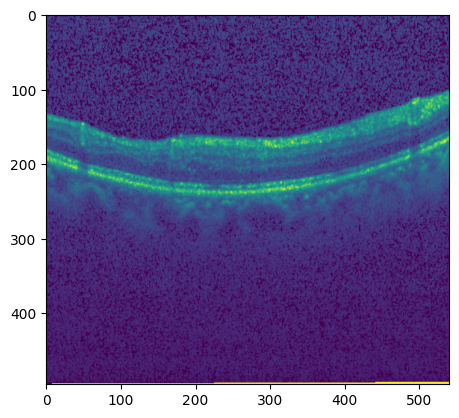

In [43]:
images = [cv.imread(x,0) for x in images_path] 
masks = [cv.imread(x,0) for x in masks_path] 

plt.imshow(images[0])

In [44]:
DEVICE  = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
BATCH_SIZE = cfg['batch_size']
LR = cfg['lr']
EPOCHS = cfg['epochs']
ENCODER = cfg['encoder']
ENCODER_WEIGHTS = cfg['weights']
RESIZE = cfg['resize']

In [45]:
testset = OCTSegmentation(images[80:],masks[80:],get_train_augs(RESIZE))
dloader_test = torch.utils.data.DataLoader(testset,batch_size=BATCH_SIZE,shuffle=False)

In [46]:
def load_model(working_dir, experiment_name, config):
    """
    Charge un modèle sauvegardé
    
    Args:
        working_dir: Répertoire de travail
        experiment_name: Nom de l'expérience
        config: Configuration du modèle (pour le recréer)
    
    Returns:
        model: Modèle chargé
    """
    DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    
    print('LOADING MODEL ...')
    
    # Chemin du checkpoint
    checkpoint_path = os.path.join(working_dir, experiment_name, 'best_model.pth')
    
    # Charger le checkpoint
    checkpoint = torch.load(checkpoint_path, map_location=DEVICE, weights_only=False)
    
    # Recréer le modèle avec la même architecture
    model, _, _ = create_model(config)
    
    # Charger les poids
    model.load_state_dict(checkpoint['model_state_dict'])
    
    # Mettre sur le device et en mode évaluation
    model.to(DEVICE)
    model.eval()
    
    print(f"✅ Modèle chargé depuis: {checkpoint_path}")
    print(f"   Epoch: {checkpoint['epoch']}")
    print(f"   Train Loss: {checkpoint['train_loss']:.4f}")
    print(f"   Test Loss: {checkpoint['test_loss']:.4f}")
    
    return model

In [47]:
model = load_model('../models/','1', cfg)

LOADING MODEL ...
✅ Modèle chargé depuis: ../models/1/best_model.pth
   Epoch: 23
   Train Loss: 0.0687
   Test Loss: 0.0600


Using device: cpu


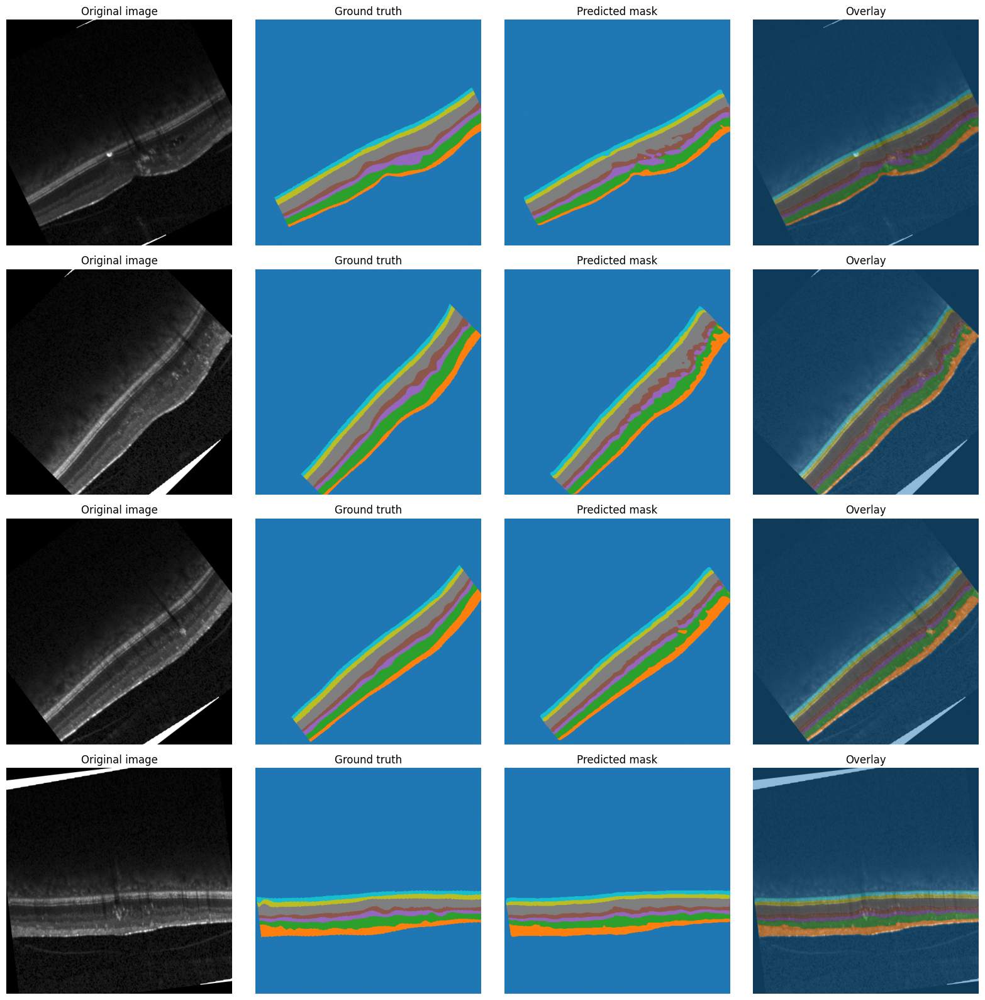

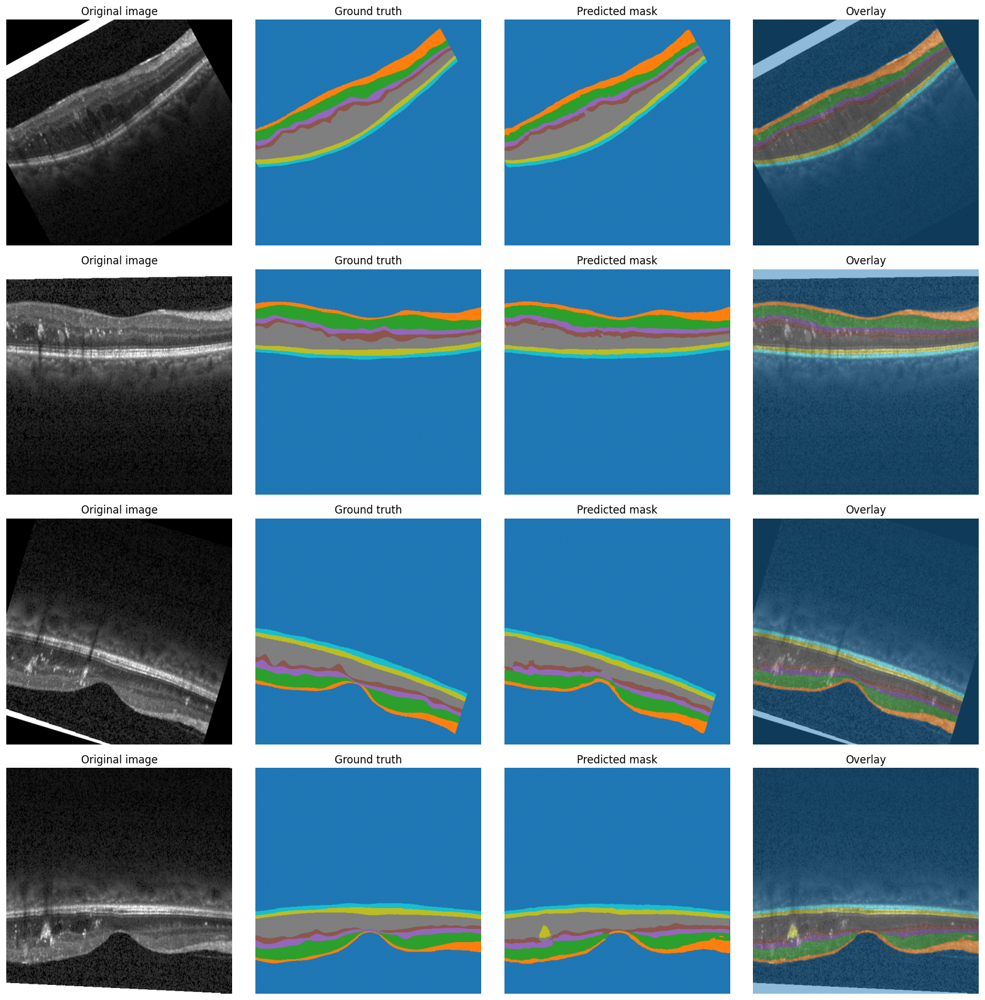

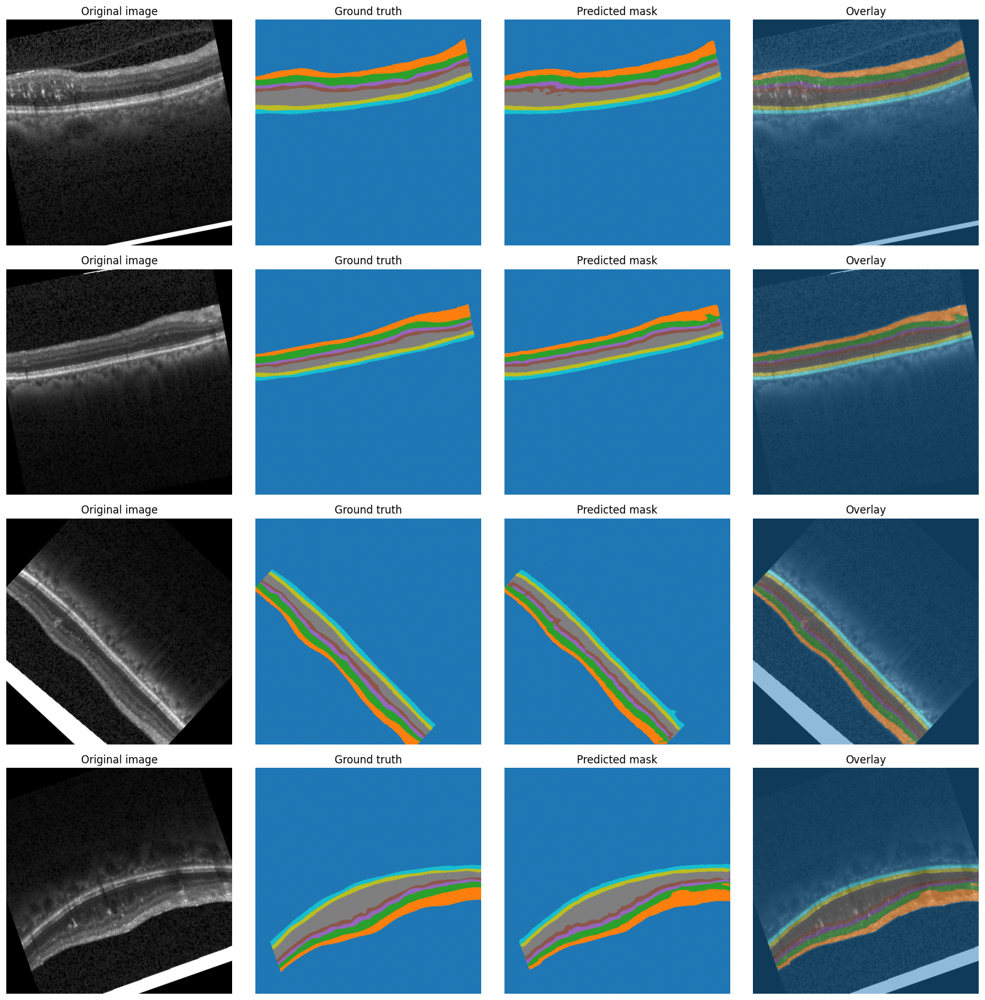

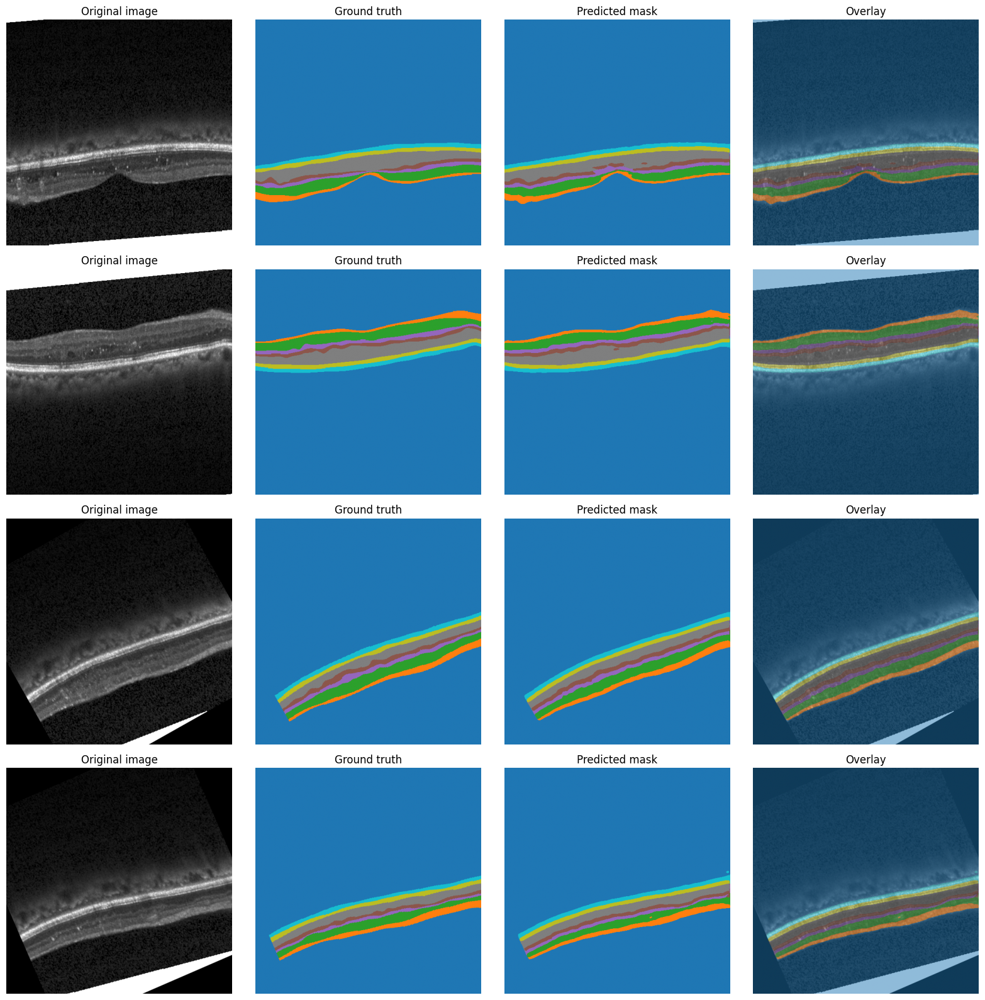

In [48]:
def show_predictions(dataloader, model, nbr_images=6, num_classes=8):
    """
    Affiche les prédictions pour segmentation multi-classes
    
    Args:
        dataloader: DataLoader
        model: Modèle de segmentation
        nbr_images: Nombre d'images à afficher
        num_classes: Nombre de classes
    """
    # Utiliser CPU si CUDA n'est pas disponible
    DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"Using device: {DEVICE}")
    
    model.to(DEVICE)
    model.eval()
    
    images_shown = 0
    
    with torch.no_grad():
        for images, masks in dataloader:
            images = images.to(DEVICE)
            masks = masks.to(DEVICE)
            
            # Squeeze masks si nécessaire
            if masks.ndim == 4:
                masks = masks.squeeze(1)
            
            # Prédiction (pas de sigmoid pour multi-classes!)
            outputs = model(images)  # (batch, num_classes, H, W)
            
            # Obtenir les classes prédites
            pred_masks = torch.argmax(outputs, dim=1)  # (batch, H, W)
            
            # Convertir en numpy
            images_np = images.cpu().numpy()
            masks_np = masks.cpu().numpy()
            pred_masks_np = pred_masks.cpu().numpy()
            
            # Afficher les images du batch
            batch_size = min(len(images), nbr_images - images_shown)

            fig, axes = plt.subplots(4, 4, figsize=(16, 16))
            
            for i in range(batch_size):
                
                # Image originale
                img = images_np[i, 0] if images_np.shape[1] == 1 else images_np[i].transpose(1, 2, 0)
                axes[i,0].imshow(img, cmap='gray')
                axes[i,0].set_title('Original image')
                axes[i,0].axis('off')
                
                # Masque vrai
                axes[i,1].imshow(masks_np[i], cmap='tab10', vmin=0, vmax=num_classes-1)
                axes[i,1].set_title('Ground truth')
                axes[i,1].axis('off')
                
                # Masque prédit
                axes[i,2].imshow(pred_masks_np[i], cmap='tab10', vmin=0, vmax=num_classes-1)
                axes[i,2].set_title('Predicted mask')
                axes[i,2].axis('off')
                
                # Overlay
                axes[i,3].imshow(img, cmap='gray')
                axes[i,3].imshow(pred_masks_np[i], cmap='tab10', alpha=0.5, vmin=0, vmax=num_classes-1)
                axes[i,3].set_title('Overlay')
                axes[i,3].axis('off')
                
            plt.tight_layout()
            plt.savefig("../docs/grille.png")
            plt.show()
                
            # images_shown += 1
            
            # if images_shown >= nbr_images:
            #     return
            
            # if images_shown >= nbr_images:
            #     return

# Utilisation
show_predictions(dloader_test, model, nbr_images=4, num_classes=8)

In [9]:
def compute_metrics_simple(dloader, model, num_classes=8):
    """Version simplifiée avec métriques essentielles"""
    print('COMPUTING METRICS ...')
    DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    
    model.to(DEVICE)
    model.eval()
    
    all_targets = []
    all_predictions = []
    
    with torch.no_grad():
        for images, masks in tqdm(dloader):
            images = images.to(DEVICE)
            masks = masks.to(DEVICE)
            
            if masks.ndim == 4:
                masks = masks.squeeze(1)
            
            # Prédiction
            outputs = model(images)
            preds = torch.argmax(outputs, dim=1)
            
            all_targets.append(masks.cpu().numpy())
            all_predictions.append(preds.cpu().numpy())
    
    # Concaténer
    all_targets = np.concatenate([t.ravel() for t in all_targets])
    all_predictions = np.concatenate([p.ravel() for p in all_predictions])
    
    # Calculer les métriques
    score = {
        'ACCURACY': accuracy_score(all_targets, all_predictions),
        'F1_SCORE': f1_score(all_targets, all_predictions, average='macro', zero_division=0),
        'PRECISION': precision_score(all_targets, all_predictions, average='macro', zero_division=0),
        'RECALL': recall_score(all_targets, all_predictions, average='macro', zero_division=0),
        'mIoU': jaccard_score(all_targets, all_predictions, average='macro', labels=range(num_classes))
    }
    
    # Afficher
    print("\n📊 Résultats:")
    for metric, value in score.items():
        print(f"{metric}: {value:.4f}")
    
    # Plot
    plt.figure(figsize=(10, 6))
    labels = list(score.keys())
    values = list(score.values())
    
    ax = sns.barplot(x=labels, y=values)
    plt.title('Metrics Results', fontweight='bold')
    plt.xlabel('Metrics', fontweight='bold')
    plt.ylabel('Values', fontweight='bold')
    plt.ylim(0, 1.0)
    
    for i, v in enumerate(values):
        ax.text(i, v + 0.02, f'{v:.2f}', ha='center', va='bottom')
    
    plt.tight_layout()
    plt.savefig("../docs/metrics.png")
    plt.show()
    
    return score

COMPUTING METRICS ...


100%|██████████| 4/4 [00:15<00:00,  3.98s/it]



📊 Résultats:
ACCURACY: 0.9769
F1_SCORE: 0.8743
PRECISION: 0.8737
RECALL: 0.8759
mIoU: 0.7837


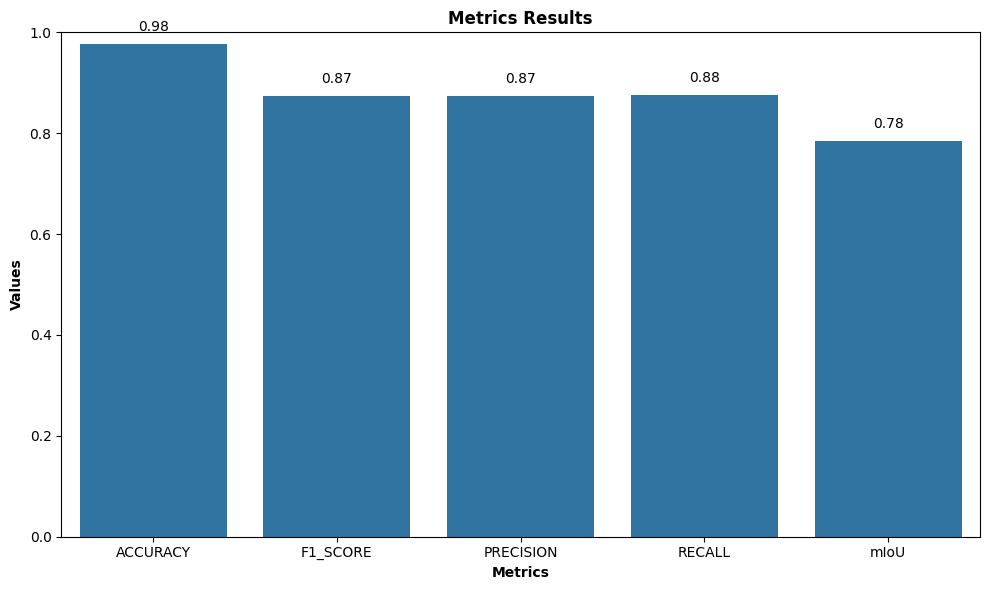

In [54]:
results = compute_metrics_simple(dloader_test, model, num_classes=8)

In [65]:
def inference(image, model):

    DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"Using device: {DEVICE}")

    model.to(DEVICE)
    model.eval()

    img = image
    img = img.astype(np.float32) / 255.0
    img_resized = cv.resize(img, (512, 512), interpolation=cv.INTER_LINEAR)
    img_tensor = torch.from_numpy(img_resized).float()
    img_tensor = img_tensor.unsqueeze(0)
    img_tensor = img_tensor.unsqueeze(0)

    print(f"Image tensor shape: {img_tensor.shape}")  # (1, 1, 512, 512)

    img_tensor = img_tensor.to(DEVICE)

    with torch.no_grad():
        outputs = model(img_tensor)  # (1, 8, 512, 512)
        pred_mask = torch.argmax(outputs, dim=1)  # (1, 512, 512)


    pred_mask_np = pred_mask[0].cpu().numpy()  # (512, 512)
    img_np = img_resized  # Pour affichage

    print(f"Prediction shape: {pred_mask_np.shape}")
    print(f"Unique classes: {np.unique(pred_mask_np)}")

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    axes[0].imshow(img_np, cmap='gray')
    axes[0].set_title('Image Originale', fontsize=14, fontweight='bold')
    axes[0].axis('off')

    cmap = ListedColormap(plt.cm.tab10(np.linspace(0, 1, 8)))
    im = axes[1].imshow(pred_mask_np, cmap=cmap, vmin=0, vmax=7)
    axes[1].set_title('Masque Prédit', fontsize=14, fontweight='bold')
    axes[1].axis('off')
    axes[2].imshow(img_np, cmap='gray')
    axes[2].imshow(pred_mask_np, cmap=cmap, alpha=0.5, vmin=0, vmax=7)
    axes[2].set_title('Overlay', fontsize=14, fontweight='bold')
    axes[2].axis('off')

    plt.colorbar(im, ax=axes, orientation='horizontal', fraction=0.05, pad=0.05,
                ticks=range(8), label='Classes')

    plt.tight_layout()
    plt.savefig("../results/predictions/test.png")
    plt.show()

In [58]:
mat = scipy.io.loadmat("/Users/anessad/Documents/PROJETS/OCT-AMD-SEGMENTATION/data/raw/2015_BOE_Chiu/Subject_08.mat")

Using device: cpu
Image tensor shape: torch.Size([1, 1, 512, 512])
Prediction shape: (512, 512)
Unique classes: [0 1 2 3 4 5 6 7]


/var/folders/09/mh7ys9_j0mxfp0_25v02kfrm0000gn/T/ipykernel_5614/4173335010.py:49: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


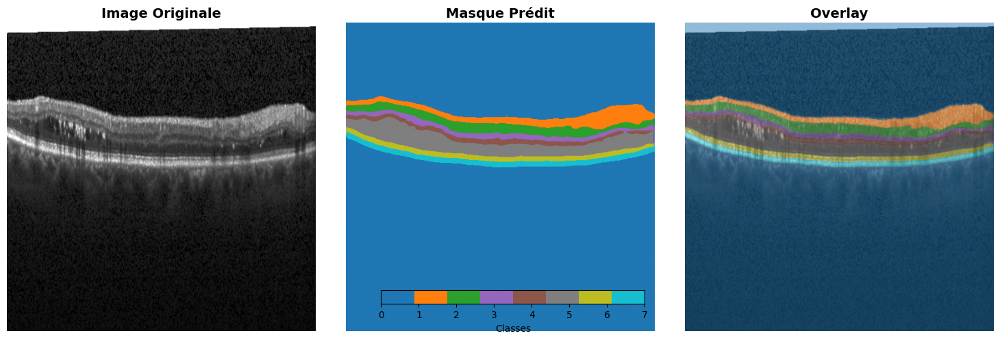

In [66]:
inference(mat["images"][:,:,15], model)

(496, 768, 61)